In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.model_selection import train_test_split
import keras
from keras.models import Model, load_model
from keras.layers import Input ,BatchNormalization , Activation 
from keras.layers.convolutional import Conv2D, UpSampling2D
from keras.layers.pooling import MaxPooling2D
from tensorflow.keras.layers import concatenate
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import optimizers 
from sklearn.model_selection import train_test_split
import os
import nibabel as nib
import cv2 as cv
import matplotlib.pyplot as plt
from keras import backend as K
import glob
import skimage.io as io
import skimage.color as color
import random as r
import math
from nilearn import plotting

In [2]:
common_path = "../../RSNA-BTC-Datasets/BraTS2021"
Flair= nib.load(common_path+'/BraTS2021_00003/BraTS2021_00003_flair.nii.gz')
Seg= nib.load(common_path+'/BraTS2021_00003/BraTS2021_00003_seg.nii.gz')
T1= nib.load(common_path+'/BraTS2021_00003/BraTS2021_00003_t1.nii.gz')
T1ce= nib.load(common_path+'/BraTS2021_00003/BraTS2021_00003_t1ce.nii.gz')
T2= nib.load(common_path+'/BraTS2021_00003/BraTS2021_00003_t2.nii.gz')

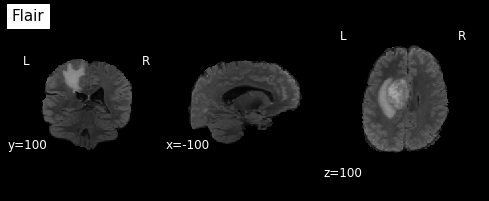

In [3]:


plotting.plot_anat(Flair,cut_coords=[-100, 100, 100],title="Flair",draw_cross =False)



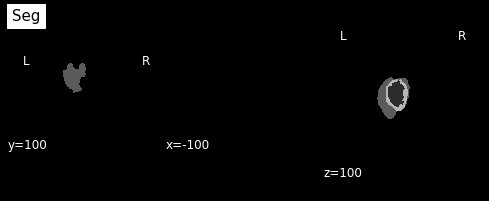

In [4]:
plotting.plot_anat(Seg,cut_coords=[-100, 100, 100],title="Seg",draw_cross =False)

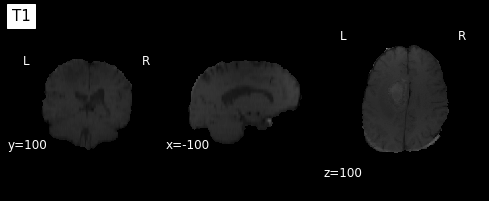

In [5]:
plotting.plot_anat(T1,cut_coords=[-100, 100, 100],title="T1",draw_cross =False)

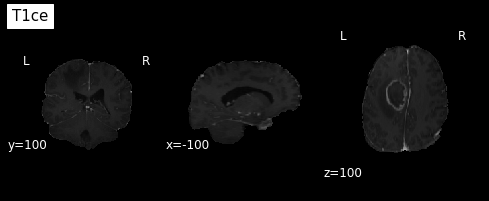

In [6]:


plotting.plot_anat(T1ce,cut_coords=[-100, 100, 100],title="T1ce",draw_cross =False)



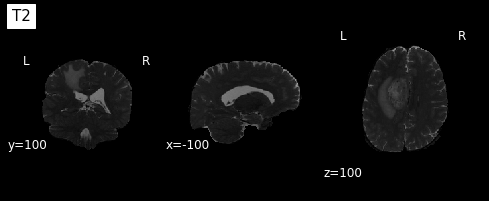

In [7]:


plotting.plot_anat(T2,cut_coords=[-100, 100, 100],title="T2",draw_cross =False)



In [22]:
from torchvision import transforms, utils, datasets
import torch
from torch.nn import functional as F

class ToTensor3D(torch.nn.Module):  #-> ok
    def __init__(self):
        super().__init__()

  
    def forward(self, tensor):
        y_new = torch.from_numpy(tensor.transpose(3,2,0,1))
        #y_new = torch.from_numpy(tensor)
        return y_new

    def __repr__(self):
        return self.__class__.__name__ + '()'
    
    
class Normalize3D(torch.nn.Module):
    def __init__(self, norm_type='min_max'):
        self.norm_type = norm_type                               
        super().__init__() 
        
    def forward(self, img):
        if self.norm_type == 'z_score':
            mean, std = torch.mean(img), torch.std(img)
            img -= mean
            img /= std+1e-8
        elif self.norm_type == 'min_max':
            try:
                nmin, nmax = torch.min(img), torch.max(img)
                inp = (img - nmin) / (nmax-nmin+1e-8)
                assert torch.max(inp) <= 1
            except:
                print("Division by zero, aborting...")
            img = inp

        return img
    
class AdjustContrast(torch.nn.Module):
    def __init__(self, mult=2.0):
        self.mult = mult
        super().__init__()
        
    def forward(self, img):
        #img = transforms.adjust_contrast(img, contrast_factor=mult)
        nmin, nmax = torch.min(img), torch.max(img)
        inp = (img - nmin) / (nmax-nmin+1e-8)
        img = inp**self.mult*(nmax-nmin)+nmin
        return img
    
class RandomRotation3D(torch.nn.Module):
    def __init__(self, p=0.5, n=1):
        self.p = p                        #probabilità di effettuare la rotazione
        self.n = n                        #numero di 90 gradi           
        super().__init__()         

    def forward(self, img):
        if random() < self.p:
            img = torch.rot90(img,self.n,dims=[2,3])
        return img

    def __repr__(self):
        return self.__class__.__name__ + '(p={}, n={})'.format(self.p, self.n)
    
class Rotation3D90Degrees(torch.nn.Module):
    def __init__(self, times=1, axis=1):              
        self.times = times                        #numero di 90 gradi   
        self.axis = axis
        super().__init__()         

    def forward(self, img):
        axes = [1,2,3]
        axes.remove(self.axis)
        img = torch.rot90(img,self.times,dims=axes)
        return img

    def __repr__(self):
        return self.__class__.__name__ + '(times={}, axis={})'.format(self.times, self.axis)

#------------------------------ 

class RandomZFlip(torch.nn.Module):
    def __init__(self, p=0.5):
        self.p = p                        #probabilità di effettuare il flip  
        super().__init__()                 

    def forward(self, img):
        if random() < self.p:
            img = torch.flip(img, [1])
        return img

    def __repr__(self):
        return self.__class__.__name__ + '(p={})'.format(self.p)
    
    
class Resize3D(torch.nn.Module):  #-> ok
    def __init__(self, size=(32,32,32)):
        self.size = size          
        super().__init__()         

    def forward(self, tensor):
        #print(tensor.shape)
        #print(tensor.unsqueeze(0).shape)
        #align_corners = True, 
        img = F.interpolate( tensor.unsqueeze(0), self.size, mode='area').squeeze(0)

        #print(img.shape)

        return img

    def __repr__(self):
        return self.__class__.__name__ + '(size={})'.format(self.size)
    
class ToFake3D(torch.nn.Module):
    def __init__(self):
        super().__init__()
        
    def forward(self, img):
        img = img.squeeze(0)
        return img
    
class Pad3D(torch.nn.Module):  #-> ok
    def __init__(self, size=(32,32,32)):
        self.size = size          
        super().__init__()         

    def forward(self, tensor):
        #print(tensor.shape)
        #print(tensor.unsqueeze(0).shape)
        pad = (int(math.ceil((self.size[2]-tensor.shape[3])/2)), int(math.floor((self.size[2]-tensor.shape[3])/2)),
               int(math.ceil((self.size[1]-tensor.shape[2])/2)), int(math.floor((self.size[1]-tensor.shape[2])/2)),
               int(math.ceil((self.size[0]-tensor.shape[1])/2)), int(math.floor((self.size[0]-tensor.shape[1])/2))
              )

        img = F.pad(tensor, pad, "constant", 0)

        #print(img.shape)

        return img

    def __repr__(self):
        return self.__class__.__name__ + '(size={})'.format(self.size)

def isometric_transform(sample, scale_factors):
    #print(scale_factors)
    #print(sample.shape)
    # With Tensor3D Transformation, idx 0 becomes 2, idx 1 becomes 0 and idx 2 becomes 1
    s1 = int(sample.shape[1]*scale_factors[2])
    s2 = int(sample.shape[2]*scale_factors[0])
    s3 = int(sample.shape[3]*scale_factors[1])
    transform = transforms.Compose([Resize3D(size=(s1,s2,s3)),
                                    #Rotation3D90Degrees(times=1, axis=1),
                                    Rotation3D90Degrees(times=3, axis=3),
                                    Pad3D(size=(240,240,240))
    ])
    return transform(sample)
    
def loader_fc_3d_nifti(path):
    np.seterr(all='raise')
    x = nib.load(path)
    y_new = x.get_fdata().astype(np.float32)
    y_new = y_new[:,:,:,np.newaxis]
    scale_factors = x.header.get_zooms()
    return y_new, scale_factors
                                    
def tensor_transform(sample):
    t_transform = transforms.Compose([
                                    ToTensor3D()#,
                                    #Normalize3D(norm_type='min_max')
    ])
    return t_transform(sample)

def Data_Preprocessing(modalities_dir):
    print(modalities_dir)
    all_modalities = []    
    for modality in modalities_dir:      
        nifti_file   = nib.load(modality)
        brain_numpy  = np.asarray(nifti_file.dataobj)    
        all_modalities.append(brain_numpy)
        #print(brain_numpy.shape)
    #print(len(all_modalities))
    brain_affine   = nifti_file.affine
    all_modalities = np.array(all_modalities)
    all_modalities = np.rint(all_modalities).astype(np.int16)
    #print(all_modalities.shape)
    all_modalities = all_modalities[:, :, :, :]
    all_modalities = np.transpose(all_modalities)
    return all_modalities

def nii_import(modalities_dir):
    all_modalities = []    
    for modality in modalities_dir:    
        sample, sf = loader_fc_3d_nifti(modality)
        sample = tensor_transform(sample)
        sample = isometric_transform(sample, sf)
        sample = sample.squeeze()
        all_modalities.append(sample.numpy())
        #print(sample.numpy().shape)
    all_modalities = np.array(all_modalities)
    all_modalities = np.rint(all_modalities).astype(np.int16)
    #print(all_modalities.shape)
    all_modalities = all_modalities[:, :, :, :]
    all_modalities = np.transpose(all_modalities)
    return all_modalities

Path= common_path
Path = "../../RSNA-BTC-Datasets/train_nii"
p=os.listdir(Path)
Input_Data= []

if Path == common_path:
    for i in p[:1]:
        brain_dir = os.path.normpath(Path+'/'+i)
        print(brain_dir)
        flair     = glob.glob(os.path.join(brain_dir, '*_flair*.nii.gz'))
        t1        = glob.glob(os.path.join(brain_dir, '*_t1*.nii.gz'))
        t1ce      = glob.glob(os.path.join(brain_dir, '*_t1ce*.nii.gz'))
        t2        = glob.glob(os.path.join(brain_dir, '*_t2*.nii.gz'))
        gt        = glob.glob( os.path.join(brain_dir, '*_seg*.nii.gz'))
        modalities_dir = [flair[0], t1[0], t1ce[0], t2[0], gt[0]]
        P_Data = Data_Preprocessing(modalities_dir)
        Input_Data.append(P_Data)
else:
    p=os.listdir(Path+"/FLAIR")
    for j in p[:1]:
        for i in os.listdir(Path+"/FLAIR/"+j)[:1]:
            Input_Data = []
            #brain_dir = os.path.normpath(Path+'/'+i)
            #print(brain_dir)
            print(os.path.join(Path, "FLAIR", j, i))
            gt_found = False
            flair     = glob.glob(os.path.join(Path, "FLAIR", j, i))
            t1        = glob.glob(os.path.join(Path, "T1w", j, i))
            t1ce      = glob.glob(os.path.join(Path, "T1wCE", j, i))
            t2        = glob.glob(os.path.join(Path, "T2w", j, i))
            gt        = glob.glob( os.path.join(Path, "SEG", j, i))
            
            modalities_dir = [flair[0], t1[0], t1ce[0], t2[0]]
            #P_Data = Data_Preprocessing(modalities_dir)
            P_Data = nii_import(modalities_dir)
                         
            Input_Data.append(P_Data)


../../RSNA-BTC-Datasets/train_nii/FLAIR/1/00652.nii.gz


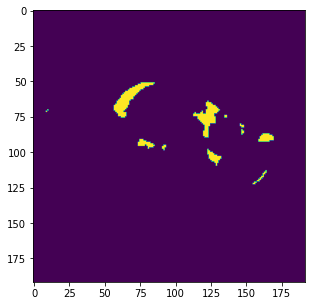

In [17]:


fig = plt.figure(figsize=(5,5))
immmg = Input_Data[0][100,:,:,3]
imgplot = plt.imshow(immmg)
plt.show()



In [18]:
fig = plt.figure(figsize=(5,5))
immmg = Input_Data[1][100,:,:,3]
imgplot = plt.imshow(immmg)
plt.show()

IndexError: list index out of range

<Figure size 360x360 with 0 Axes>

In [19]:
def Data_Concatenate(Input_Data):
    counter=0
    Output= []
    for i in range(5):
        print('$')
        c=0
        counter=0
        for ii in range(len(Input_Data)):
            if (counter != len(Input_Data)):
                a= Input_Data[counter][:,:,:,i]
                #print('a={}'.format(a.shape))
                b= Input_Data[counter+1][:,:,:,i]
                #print('b={}'.format(b.shape))
                if(counter==0):
                    c= np.concatenate((a, b), axis=0)
                    print('c1={}'.format(c.shape))
                    counter= counter+2
                else:
                    c1= np.concatenate((a, b), axis=0)
                    c= np.concatenate((c, c1), axis=0)
                    print('c2={}'.format(c.shape))
                    counter= counter+2
        c= c[:,:,:,np.newaxis]
        Output.append(c)
    return Output


In [20]:


InData= Data_Concatenate(Input_Data)



$


IndexError: list index out of range

In [21]:


#AIO= concatenate(InData, axis=3)
AIO = concatenate(Input_Data, axis=3)
AIO=np.array(AIO,dtype='float32')
TR=np.array(AIO[:,:,:,1],dtype='float32')
AIO = 0
#TRL=np.array(AIO[:,:,:,4],dtype='float32')



2022-07-06 12:30:48.254271: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-06 12:30:48.284748: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-06 12:30:48.285076: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-06 12:30:48.286240: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags

In [22]:
#X_train , X_test, Y_train, Y_test = train_test_split(TR, TRL, test_size=0.15, random_state=32)
#AIO=TRL=0

In [9]:
def Convolution(input_tensor,filters):
    
    x = Conv2D(filters=filters,kernel_size=(3, 3),padding = 'same',strides=(1, 1))(input_tensor)
    x = BatchNormalization()(x)
    x = Activation('relu')(x) 
    return x

def model(input_shape):
    
    inputs = Input((input_shape))
    
    conv_1 = Convolution(inputs,32)
    maxp_1 = MaxPooling2D(pool_size = (2, 2), strides = (2, 2), padding = 'same') (conv_1)
    
    conv_2 = Convolution(maxp_1,64)
    maxp_2 = MaxPooling2D(pool_size = (2, 2), strides = (2, 2), padding = 'same') (conv_2)
    
    conv_3 = Convolution(maxp_2,128)
    maxp_3 = MaxPooling2D(pool_size = (2, 2), strides = (2, 2), padding = 'same') (conv_3)
    
    conv_4 = Convolution(maxp_3,256)
    maxp_4 = MaxPooling2D(pool_size = (2, 2), strides = (2, 2), padding = 'same') (conv_4)
    
    conv_5 = Convolution(maxp_4,512)
    upsample_6 = UpSampling2D((2, 2)) (conv_5)
    
    conv_6 = Convolution(upsample_6,256)
    upsample_7 = UpSampling2D((2, 2)) (conv_6)
    
    upsample_7 = concatenate([upsample_7, conv_3])
    
    conv_7 = Convolution(upsample_7,128)
    upsample_8 = UpSampling2D((2, 2)) (conv_7)
    
    conv_8 = Convolution(upsample_8,64)
    upsample_9 = UpSampling2D((2, 2)) (conv_8)
    
    upsample_9 = concatenate([upsample_9, conv_1])
    
    conv_9 = Convolution(upsample_9,32)
    outputs = Conv2D(1, (1, 1), activation='sigmoid') (conv_9)
    
    model = Model(inputs=[inputs], outputs=[outputs]) 
    
    return model

In [10]:


# Loding the Light weighted CNN
model = model(input_shape = (240,240,1))
model.summary()



2022-07-06 12:38:30.052688: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-06 12:38:30.084027: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-06 12:38:30.084363: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-06 12:38:30.085654: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 240, 240, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 240, 240, 32  320         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 240, 240, 32  128        ['conv2d[0][0]']                 
 alization)                     )                                                             

                                                                                                  
 activation_7 (Activation)      (None, 120, 120, 64  0           ['batch_normalization_7[0][0]']  
                                )                                                                 
                                                                                                  
 up_sampling2d_3 (UpSampling2D)  (None, 240, 240, 64  0          ['activation_7[0][0]']           
                                )                                                                 
                                                                                                  
 concatenate_1 (Concatenate)    (None, 240, 240, 96  0           ['up_sampling2d_3[0][0]',        
                                )                                 'activation[0][0]']             
                                                                                                  
 conv2d_8 

In [11]:
# Computing Dice_Coefficient
def dice_coef(y_true, y_pred, smooth=1.0):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

# Computing Precision 
def precision(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
        precision = true_positives / (predicted_positives + K.epsilon())
        return precision

# Computing Sensitivity      
def sensitivity(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    return true_positives / (possible_positives + K.epsilon())

# Computing Specificity
def specificity(y_true, y_pred):
    true_negatives = K.sum(K.round(K.clip((1-y_true) * (1-y_pred), 0, 1)))
    possible_negatives = K.sum(K.round(K.clip(1-y_true, 0, 1)))
    return true_negatives / (possible_negatives + K.epsilon())

In [12]:


# Accuracy vs Epoch
def Accuracy_Graph(history):
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    #plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper left')
    plt.subplots_adjust(top=1.00, bottom=0.0, left=0.0, right=0.95, hspace=0.25,
                        wspace=0.35)
    plt.show()
    
# Dice Similarity Coefficient vs Epoch
def Dice_coefficient_Graph(history):

    plt.plot(history.history['dice_coef'])
    plt.plot(history.history['val_dice_coef'])
    #plt.title('Dice_Coefficient')
    plt.ylabel('Dice_Coefficient')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper left')
    plt.subplots_adjust(top=1.00, bottom=0.0, left=0.0, right=0.95, hspace=0.25,
                        wspace=0.35)
    plt.show()
# Loss vs Epoch
def Loss_Graph(history):

    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    #plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper left')
    plt.subplots_adjust(top=1.00, bottom=0.0, left=0.0, right=0.95, hspace=0.25,
                        wspace=0.35)
    plt.show()



In [13]:
model.load_weights('../../RSNA-BTC-Datasets/out_models/BraTs2020.h5')

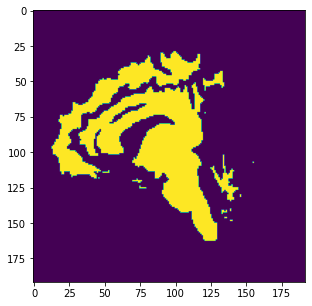

In [28]:


fig = plt.figure(figsize=(5,5))
immmg = TR[100,:,:]
imgplot = plt.imshow(immmg)
plt.show()



In [43]:


pref_Tumor = model.predict(TR)



5/5 [==============================] - 1s 295ms/step


2022-07-06 10:36:48.787287: W tensorflow/core/common_runtime/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.80GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2022-07-06 10:36:48.787372: W tensorflow/core/common_runtime/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.80GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2022-07-06 10:36:48.833921: W tensorflow/core/common_runtime/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 1.99GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2022-07-06 10:36:48.833968: W tensorflow/core/common_runtime/bfc_allocato

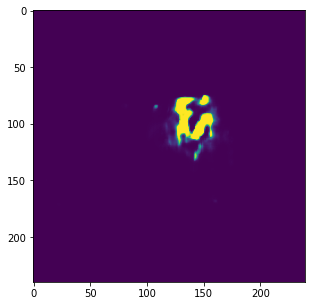

In [45]:


fig = plt.figure(figsize=(5,5))
immmg = pref_Tumor[100,:,:,0]
imgplot = plt.imshow(immmg)
plt.show()



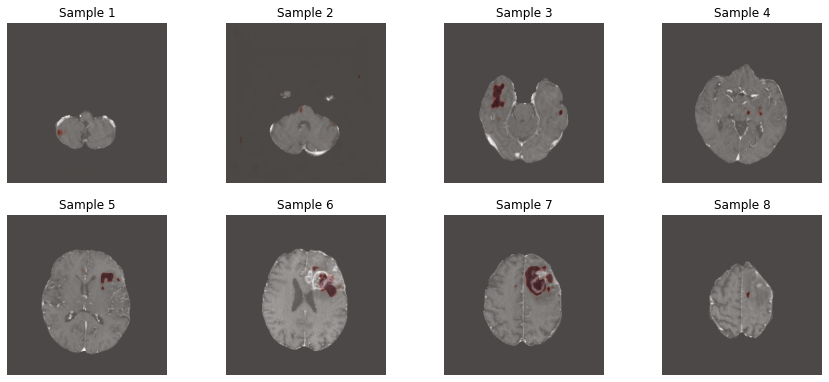

In [48]:
plt.figure(figsize=(15,10))

for i in range(8):
    plt.subplot(341+i)
    plt.title('Sample '+str(i+1))
    plt.axis('off')
    plt.imshow(np.squeeze(TR[15*(i+1),:,:]),cmap='gray')
    plt.imshow(np.squeeze(pref_Tumor[15*(i+1),:,:]),alpha=0.3,cmap='Reds')

In [ ]:
TR = 0

IndexError: index 1450 is out of bounds for axis 0 with size 930

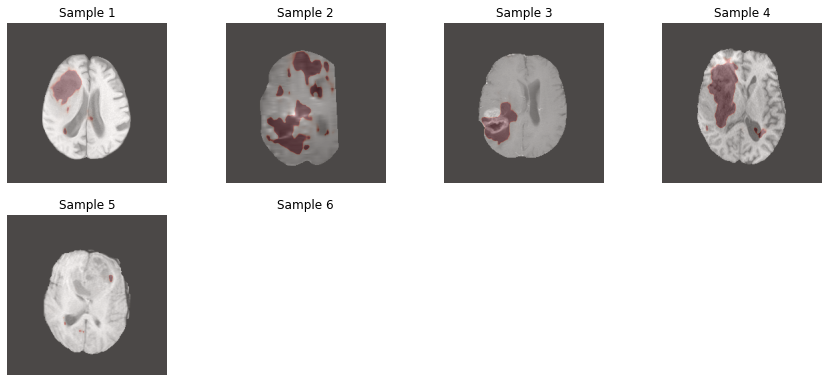

In [25]:
plt.figure(figsize=(15,10))

plt.subplot(341)
plt.title('Sample 1')
plt.axis('off')
plt.imshow(np.squeeze(TR[250,:,:]),cmap='gray')
plt.imshow(np.squeeze(pref_Tumor[250,:,:]),alpha=0.3,cmap='Reds')

plt.subplot(342)
plt.title('Sample 2')
plt.axis('off')
plt.imshow(np.squeeze(TR[550,:,:]),cmap='gray')
plt.imshow(np.squeeze(pref_Tumor[550,:,:]),alpha=0.3,cmap='Reds')

plt.subplot(343)
plt.title('Sample 3')
plt.axis('off')
plt.imshow(np.squeeze(TR[400,:,:]),cmap='gray')
plt.imshow(np.squeeze(pref_Tumor[400,:,:]),alpha=0.3,cmap='Reds')

plt.subplot(344)
plt.title('Sample 4')
plt.axis('off')
plt.imshow(np.squeeze(TR[690,:,:]),cmap='gray')
plt.imshow(np.squeeze(pref_Tumor[690,:,:]),alpha=0.3,cmap='Reds')

plt.subplot(345)
plt.title('Sample 5')
plt.axis('off')
plt.imshow(np.squeeze(TR[850,:,:]),cmap='gray')
plt.imshow(np.squeeze(pref_Tumor[850,:,:]),alpha=0.3,cmap='Reds')

plt.subplot(346)
plt.title('Sample 6')
plt.axis('off')
plt.imshow(np.squeeze(TR[1450,:,:]),cmap='gray')
plt.imshow(np.squeeze(pref_Tumor[1450,:,:]),alpha=0.3,cmap='Reds')

plt.subplot(347)
plt.title('Sample 7')
plt.axis('off')
plt.imshow(np.squeeze(TR[1800,:,:]),cmap='gray')
plt.imshow(np.squeeze(pref_Tumor[1800,:,:]),alpha=0.3,cmap='Reds')

plt.subplot(348)
plt.title('Sample 8')
plt.axis('off')
plt.imshow(np.squeeze(TR[60,:,:]),cmap='gray')
plt.imshow(np.squeeze(pref_Tumor[60,:,:]),alpha=0.3,cmap='Reds')

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 240, 240, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_50 (Conv2D)             (None, 240, 240, 32  320         ['input_6[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_45 (BatchN  (None, 240, 240, 32  128        ['conv2d_50[0][0]']              
 ormalization)                  )                                                           

 conv2d_57 (Conv2D)             (None, 120, 120, 64  73792       ['up_sampling2d_22[0][0]']       
                                )                                                                 
                                                                                                  
 batch_normalization_52 (BatchN  (None, 120, 120, 64  256        ['conv2d_57[0][0]']              
 ormalization)                  )                                                                 
                                                                                                  
 activation_52 (Activation)     (None, 120, 120, 64  0           ['batch_normalization_52[0][0]'] 
                                )                                                                 
                                                                                                  
 up_sampling2d_23 (UpSampling2D  (None, 240, 240, 64  0          ['activation_52[0][0]']          
 )        

/tmp/ipykernel_98556/1056319309.py:340: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,10))


8/8 [==============================] - 0s 66ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/0/00452.nii.gz
8/8 [==============================] - 1s 67ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/0/00454.nii.gz
8/8 [==============================] - 0s 66ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/0/00455.nii.gz
8/8 [==============================] - 0s 67ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/0/00459.nii.gz
8/8 [==============================] - 0s 66ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/0/00464.nii.gz
8/8 [==============================] - 1s 68ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/0/00469.nii.gz
8/8 [==============================] - 0s 66ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/0/00477.nii.gz
8/8 [==============================] - 0s 66ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/0/00481.nii.gz
8/8 [==============================] - 0s 67ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/0/00495.nii.gz
8/8 [==============================] 

8/8 [==============================] - 0s 66ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/0/00735.nii.gz
8/8 [==============================] - 0s 66ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/0/00742.nii.gz
8/8 [==============================] - 0s 66ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/0/00744.nii.gz
8/8 [==============================] - 0s 66ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/0/00747.nii.gz
8/8 [==============================] - 0s 65ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/0/00751.nii.gz
8/8 [==============================] - 0s 66ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/0/00753.nii.gz
8/8 [==============================] - 0s 66ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/0/00756.nii.gz
8/8 [==============================] - 0s 66ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/0/00759.nii.gz
8/8 [==============================] - 0s 66ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/0/00764.nii.gz
8/8 [==============================] 

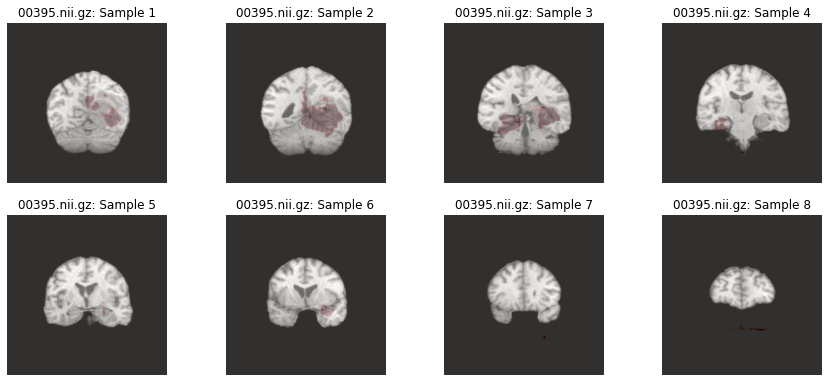

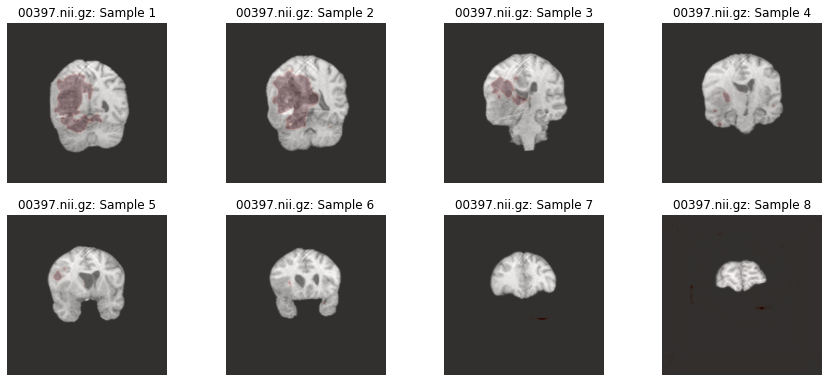

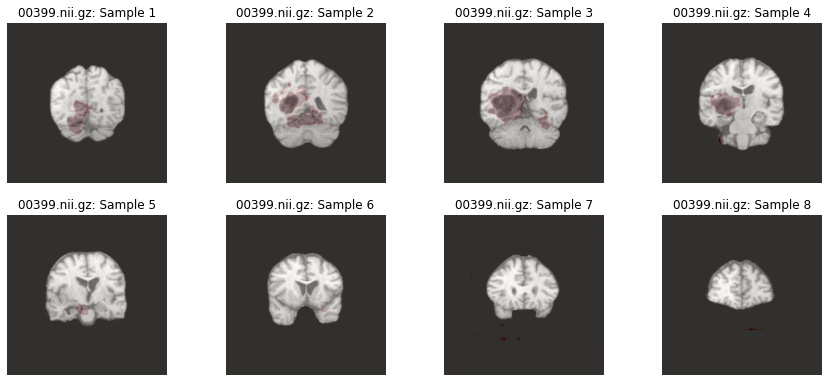

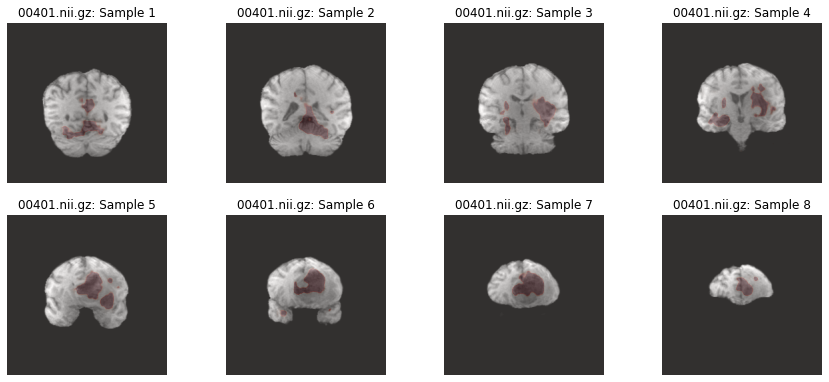

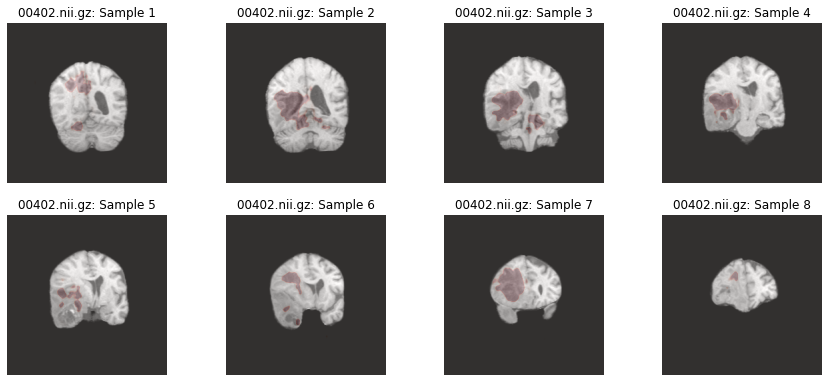

...

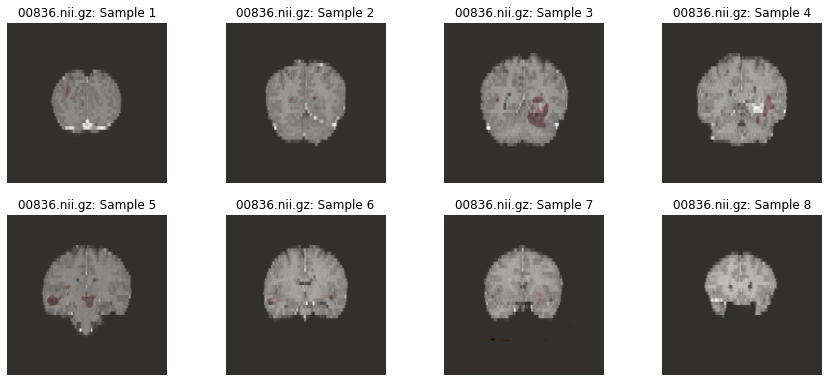

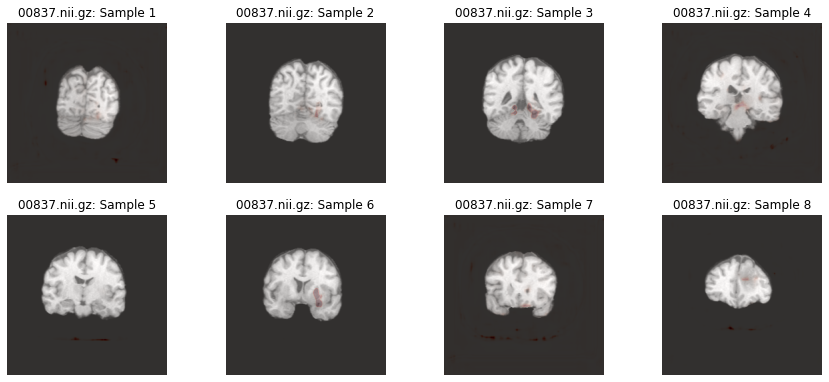

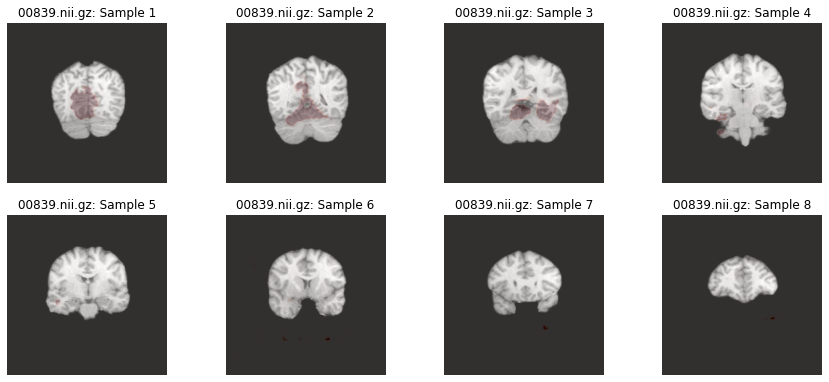

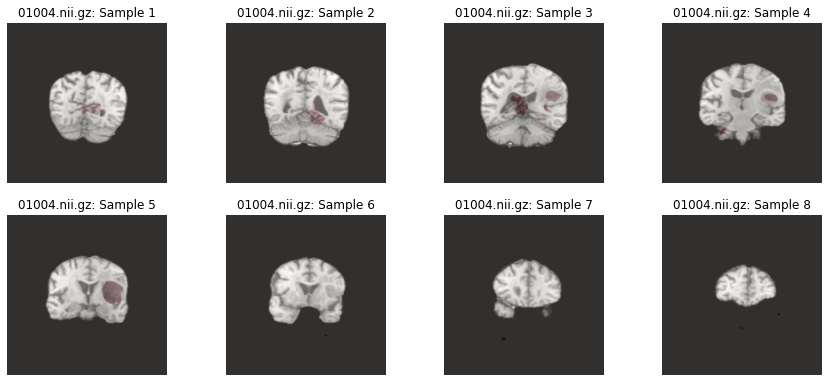

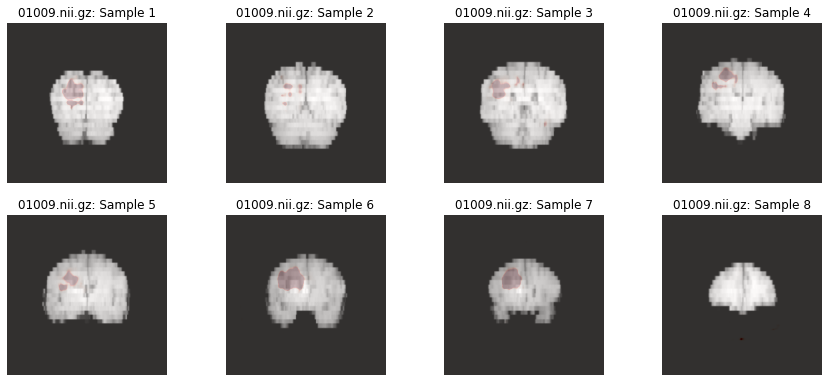

In [9]:
def Convolution(input_tensor,filters):
    
    x = Conv2D(filters=filters,kernel_size=(3, 3),padding = 'same',strides=(1, 1))(input_tensor)
    x = BatchNormalization()(x)
    x = Activation('relu')(x) 
    return x

def model(input_shape):
    
    inputs = Input((input_shape))
    
    conv_1 = Convolution(inputs,32)
    maxp_1 = MaxPooling2D(pool_size = (2, 2), strides = (2, 2), padding = 'same') (conv_1)
    
    conv_2 = Convolution(maxp_1,64)
    maxp_2 = MaxPooling2D(pool_size = (2, 2), strides = (2, 2), padding = 'same') (conv_2)
    
    conv_3 = Convolution(maxp_2,128)
    maxp_3 = MaxPooling2D(pool_size = (2, 2), strides = (2, 2), padding = 'same') (conv_3)
    
    conv_4 = Convolution(maxp_3,256)
    maxp_4 = MaxPooling2D(pool_size = (2, 2), strides = (2, 2), padding = 'same') (conv_4)
    
    conv_5 = Convolution(maxp_4,512)
    upsample_6 = UpSampling2D((2, 2)) (conv_5)
    
    conv_6 = Convolution(upsample_6,256)
    upsample_7 = UpSampling2D((2, 2)) (conv_6)
    
    upsample_7 = concatenate([upsample_7, conv_3])
    
    conv_7 = Convolution(upsample_7,128)
    upsample_8 = UpSampling2D((2, 2)) (conv_7)
    
    conv_8 = Convolution(upsample_8,64)
    upsample_9 = UpSampling2D((2, 2)) (conv_8)
    
    upsample_9 = concatenate([upsample_9, conv_1])
    
    conv_9 = Convolution(upsample_9,32)
    outputs = Conv2D(1, (1, 1), activation='sigmoid') (conv_9)
    
    model = Model(inputs=[inputs], outputs=[outputs]) 
    
    return model

# Loding the Light weighted CNN
model = model(input_shape = (240,240,1))
model.summary()
model.load_weights('../../RSNA-BTC-Datasets/out_models/BraTs2020.h5')

from torchvision import transforms, utils, datasets
import torch
from torch.nn import functional as F

class ToTensor3D(torch.nn.Module):  #-> ok
    def __init__(self):
        super().__init__()

  
    def forward(self, tensor):
        y_new = torch.from_numpy(tensor.transpose(3,2,0,1))
        #y_new = torch.from_numpy(tensor)
        return y_new

    def __repr__(self):
        return self.__class__.__name__ + '()'
    
    
class Normalize3D(torch.nn.Module):
    def __init__(self, norm_type='min_max'):
        self.norm_type = norm_type                               
        super().__init__() 
        
    def forward(self, img):
        if self.norm_type == 'z_score':
            mean, std = torch.mean(img), torch.std(img)
            img -= mean
            img /= std+1e-8
        elif self.norm_type == 'min_max':
            try:
                nmin, nmax = torch.min(img), torch.max(img)
                inp = (img - nmin) / (nmax-nmin+1e-8)
                assert torch.max(inp) <= 1
            except:
                print("Division by zero, aborting...")
            img = inp

        return img
    
class AdjustContrast(torch.nn.Module):
    def __init__(self, mult=2.0):
        self.mult = mult
        super().__init__()
        
    def forward(self, img):
        #img = transforms.adjust_contrast(img, contrast_factor=mult)
        nmin, nmax = torch.min(img), torch.max(img)
        inp = (img - nmin) / (nmax-nmin+1e-8)
        img = inp**self.mult*(nmax-nmin)+nmin
        return img
    
class RandomRotation3D(torch.nn.Module):
    def __init__(self, p=0.5, n=1):
        self.p = p                        #probabilità di effettuare la rotazione
        self.n = n                        #numero di 90 gradi           
        super().__init__()         

    def forward(self, img):
        if random() < self.p:
            img = torch.rot90(img,self.n,dims=[2,3])
        return img

    def __repr__(self):
        return self.__class__.__name__ + '(p={}, n={})'.format(self.p, self.n)
    
class Rotation3D90Degrees(torch.nn.Module):
    def __init__(self, times=1, axis=1):              
        self.times = times                        #numero di 90 gradi   
        self.axis = axis
        super().__init__()         

    def forward(self, img):
        axes = [1,2,3]
        axes.remove(self.axis)
        img = torch.rot90(img,self.times,dims=axes)
        return img

    def __repr__(self):
        return self.__class__.__name__ + '(times={}, axis={})'.format(self.times, self.axis)

#------------------------------ 

class RandomZFlip(torch.nn.Module):
    def __init__(self, p=0.5):
        self.p = p                        #probabilità di effettuare il flip  
        super().__init__()                 

    def forward(self, img):
        if random() < self.p:
            img = torch.flip(img, [1])
        return img

    def __repr__(self):
        return self.__class__.__name__ + '(p={})'.format(self.p)
    
    
class Resize3D(torch.nn.Module):  #-> ok
    def __init__(self, size=(32,32,32)):
        self.size = size          
        super().__init__()         

    def forward(self, tensor):
        #print(tensor.shape)
        #print(tensor.unsqueeze(0).shape)
        #align_corners = True, 
        img = F.interpolate( tensor.unsqueeze(0), self.size, mode='area').squeeze(0)

        #print(img.shape)

        return img

    def __repr__(self):
        return self.__class__.__name__ + '(size={})'.format(self.size)
    
class ToFake3D(torch.nn.Module):
    def __init__(self):
        super().__init__()
        
    def forward(self, img):
        img = img.squeeze(0)
        return img
    
class Pad3D(torch.nn.Module):  #-> ok
    def __init__(self, size=(32,32,32)):
        self.size = size          
        super().__init__()         

    def forward(self, tensor):
        #print(tensor.shape)
        #print(tensor.unsqueeze(0).shape)
        pad = (int(math.ceil((self.size[2]-tensor.shape[3])/2)), int(math.floor((self.size[2]-tensor.shape[3])/2)),
               int(math.ceil((self.size[1]-tensor.shape[2])/2)), int(math.floor((self.size[1]-tensor.shape[2])/2)),
               int(math.ceil((self.size[0]-tensor.shape[1])/2)), int(math.floor((self.size[0]-tensor.shape[1])/2))
              )

        img = F.pad(tensor, pad, "constant", 0)

        #print(img.shape)

        return img

    def __repr__(self):
        return self.__class__.__name__ + '(size={})'.format(self.size)

def isometric_transform(sample, scale_factors):
    #print(scale_factors)
    #print(sample.shape)
    # With Tensor3D Transformation, idx 0 becomes 2, idx 1 becomes 0 and idx 2 becomes 1
    s1 = int(sample.shape[1]*scale_factors[2])
    s2 = int(sample.shape[2]*scale_factors[0])
    s3 = int(sample.shape[3]*scale_factors[1])
    transform = transforms.Compose([Resize3D(size=(s1,s2,s3)),
                                    #Rotation3D90Degrees(times=1, axis=1),
                                    Rotation3D90Degrees(times=3, axis=3),
                                    Pad3D(size=(240,240,240))
    ])
    return transform(sample)
    
def loader_fc_3d_nifti(path):
    np.seterr(all='raise')
    x = nib.load(path)
    y_new = x.get_fdata().astype(np.float32)
    y_new = y_new[:,:,:,np.newaxis]
    scale_factors = x.header.get_zooms()
    return y_new, scale_factors
                                    
def tensor_transform(sample):
    t_transform = transforms.Compose([
                                    ToTensor3D()#,
                                    #Normalize3D(norm_type='min_max')
    ])
    return t_transform(sample)

def Data_Preprocessing(modalities_dir):
    print(modalities_dir)
    all_modalities = []    
    for modality in modalities_dir:      
        nifti_file   = nib.load(modality)
        brain_numpy  = np.asarray(nifti_file.dataobj)    
        all_modalities.append(brain_numpy)
        #print(brain_numpy.shape)
    #print(len(all_modalities))
    brain_affine   = nifti_file.affine
    all_modalities = np.array(all_modalities)
    all_modalities = np.rint(all_modalities).astype(np.int16)
    #print(all_modalities.shape)
    all_modalities = all_modalities[:, :, :, :]
    all_modalities = np.transpose(all_modalities)
    return all_modalities

def nii_import(modalities_dir):
    all_modalities = []    
    for modality in modalities_dir:    
        sample, sf = loader_fc_3d_nifti(modality)
        sample = tensor_transform(sample)
        sample = isometric_transform(sample, sf)
        sample = sample.squeeze()
        all_modalities.append(sample.numpy())
        #print(sample.numpy().shape)
    all_modalities = np.array(all_modalities)
    all_modalities = np.rint(all_modalities).astype(np.int16)
    #print(all_modalities.shape)
    all_modalities = all_modalities[:, :, :, :]
    all_modalities = np.transpose(all_modalities)
    return all_modalities

#Path = "../../RSNA-BTC-Datasets/BraTS2021"
Path = "../../RSNA-BTC-Datasets/train_nii"
if Path == "../../RSNA-BTC-Datasets/BraTS2021":
    p=os.listdir(Path)
    for i in p:
        Input_Data = []
        brain_dir = os.path.normpath(Path+'/'+i)
        print(brain_dir)
        gt_found = False
        flair     = glob.glob(os.path.join(brain_dir, '*_flair*.nii.gz'))
        t1        = glob.glob(os.path.join(brain_dir, '*_t1*.nii.gz'))
        t1ce      = glob.glob(os.path.join(brain_dir, '*_t1ce*.nii.gz'))
        t2        = glob.glob(os.path.join(brain_dir, '*_t2*.nii.gz'))
        gt        = glob.glob( os.path.join(brain_dir, '*_seg*.nii.gz'))
        if len(gt) > 0:
            gt_found = True
            modalities_dir = [flair[0], t1[0], t1ce[0], t2[0], gt[0]]
        else:
            modalities_dir = [flair[0], t1[0], t1ce[0], t2[0]]
        P_Data = Data_Preprocessing(modalities_dir)
        Input_Data.append(P_Data)

        AIO = concatenate(Input_Data, axis=3)
        AIO=np.array(AIO,dtype='float32')
        TR=np.array(AIO[:,:,:,1],dtype='float32')
        if gt_found:
            TRL=np.array(AIO[:,:,:,4],dtype='float32')
        else:
            TRL = 0
        AIO = 0

        pref_Tumor = model.predict(TR)

        plt.figure(figsize=(15,10))

        for n in range(8):
            plt.subplot(341+n)
            plt.title(i+': Sample '+str(n+1))
            plt.axis('off')
            plt.imshow(np.squeeze(TR[15*(n+1),:,:]),cmap='gray')
            plt.imshow(np.squeeze(pref_Tumor[15*(n+1),:,:]),alpha=0.3,cmap='Reds')
            if gt_found:
                plt.imshow(np.squeeze(TRL[15*(n+1),:,:]),alpha=0.3,cmap='Blues')

        TR = TRL = 0
else:
    p=os.listdir(Path+"/FLAIR")
    for j in p:
        if j == "0":
            sorted_list = os.listdir(Path+"/FLAIR/"+j)
            sorted_list.sort()
            for i in sorted_list[135:]:
                Input_Data = []
                #brain_dir = os.path.normpath(Path+'/'+i)
                #print(brain_dir)
                print(os.path.join(Path, "FLAIR", j, i))
                gt_found = False
                flair     = glob.glob(os.path.join(Path, "FLAIR", j, i))
                t1        = glob.glob(os.path.join(Path, "T1w", j, i))
                t1ce      = glob.glob(os.path.join(Path, "T1wCE", j, i))
                t2        = glob.glob(os.path.join(Path, "T2w", j, i))
                gt        = glob.glob( os.path.join(Path, "SEG", j, i))

                if len(gt) > 0:
                    gt_found = True
                    modalities_dir = [flair[0], t1[0], t1ce[0], t2[0], gt[0]]
                else:
                    modalities_dir = [flair[0], t1[0], t1ce[0], t2[0]]
                P_Data = nii_import(modalities_dir)
                Input_Data.append(P_Data)

                AIO = concatenate(Input_Data, axis=3)
                AIO=np.array(AIO,dtype='float32')
                TR=np.array(AIO[:,:,:,1],dtype='float32')
                if gt_found:
                    TRL=np.array(AIO[:,:,:,4],dtype='float32')
                else:
                    TRL = 0
                AIO = 0

                pref_Tumor = model.predict(TR)

                plt.figure(figsize=(15,10))

                for n in range(8):
                    plt.subplot(341+n)
                    plt.title(i+': Sample '+str(n+1))
                    plt.axis('off')
                    plt.imshow(np.squeeze(TR[45+15*(n+1),:,:]),cmap='gray')
                    plt.imshow(np.squeeze(pref_Tumor[45+15*(n+1),:,:]),alpha=0.2,cmap='Reds')
                    if gt_found:
                        plt.imshow(np.squeeze(TRL[45+15*(n+1),:,:]),alpha=0.2,cmap='Blues')

                AIO = TR = TRL = 0

In [3]:
from scipy.io import savemat

def Convolution(input_tensor,filters):
    
    x = Conv2D(filters=filters,kernel_size=(3, 3),padding = 'same',strides=(1, 1))(input_tensor)
    x = BatchNormalization()(x)
    x = Activation('relu')(x) 
    return x

def model(input_shape):
    
    inputs = Input((input_shape))
    
    conv_1 = Convolution(inputs,32)
    maxp_1 = MaxPooling2D(pool_size = (2, 2), strides = (2, 2), padding = 'same') (conv_1)
    
    conv_2 = Convolution(maxp_1,64)
    maxp_2 = MaxPooling2D(pool_size = (2, 2), strides = (2, 2), padding = 'same') (conv_2)
    
    conv_3 = Convolution(maxp_2,128)
    maxp_3 = MaxPooling2D(pool_size = (2, 2), strides = (2, 2), padding = 'same') (conv_3)
    
    conv_4 = Convolution(maxp_3,256)
    maxp_4 = MaxPooling2D(pool_size = (2, 2), strides = (2, 2), padding = 'same') (conv_4)
    
    conv_5 = Convolution(maxp_4,512)
    upsample_6 = UpSampling2D((2, 2)) (conv_5)
    
    conv_6 = Convolution(upsample_6,256)
    upsample_7 = UpSampling2D((2, 2)) (conv_6)
    
    upsample_7 = concatenate([upsample_7, conv_3])
    
    conv_7 = Convolution(upsample_7,128)
    upsample_8 = UpSampling2D((2, 2)) (conv_7)
    
    conv_8 = Convolution(upsample_8,64)
    upsample_9 = UpSampling2D((2, 2)) (conv_8)
    
    upsample_9 = concatenate([upsample_9, conv_1])
    
    conv_9 = Convolution(upsample_9,32)
    outputs = Conv2D(1, (1, 1), activation='sigmoid') (conv_9)
    
    model = Model(inputs=[inputs], outputs=[outputs]) 
    
    return model

# Loding the Light weighted CNN
model = model(input_shape = (240,240,1))
model.summary()
model.load_weights('../../RSNA-BTC-Datasets/out_models/BraTs2020.h5')

from torchvision import transforms, utils, datasets
import torch
from torch.nn import functional as F

class ToTensor3D(torch.nn.Module):  #-> ok
    def __init__(self):
        super().__init__()

  
    def forward(self, tensor):
        y_new = torch.from_numpy(tensor.transpose(3,2,0,1))
        #y_new = torch.from_numpy(tensor)
        return y_new

    def __repr__(self):
        return self.__class__.__name__ + '()'
    
    
class Normalize3D(torch.nn.Module):
    def __init__(self, norm_type='min_max'):
        self.norm_type = norm_type                               
        super().__init__() 
        
    def forward(self, img):
        if self.norm_type == 'z_score':
            mean, std = torch.mean(img), torch.std(img)
            img -= mean
            img /= std+1e-8
        elif self.norm_type == 'min_max':
            try:
                nmin, nmax = torch.min(img), torch.max(img)
                inp = (img - nmin) / (nmax-nmin+1e-8)
                assert torch.max(inp) <= 1
            except:
                print("Division by zero, aborting...")
            img = inp

        return img
    
class AdjustContrast(torch.nn.Module):
    def __init__(self, mult=2.0):
        self.mult = mult
        super().__init__()
        
    def forward(self, img):
        #img = transforms.adjust_contrast(img, contrast_factor=mult)
        nmin, nmax = torch.min(img), torch.max(img)
        inp = (img - nmin) / (nmax-nmin+1e-8)
        img = inp**self.mult*(nmax-nmin)+nmin
        return img
    
class RandomRotation3D(torch.nn.Module):
    def __init__(self, p=0.5, n=1):
        self.p = p                        #probabilità di effettuare la rotazione
        self.n = n                        #numero di 90 gradi           
        super().__init__()         

    def forward(self, img):
        if random() < self.p:
            img = torch.rot90(img,self.n,dims=[2,3])
        return img

    def __repr__(self):
        return self.__class__.__name__ + '(p={}, n={})'.format(self.p, self.n)
    
class Rotation3D90Degrees(torch.nn.Module):
    def __init__(self, times=1, axis=1):              
        self.times = times                        #numero di 90 gradi   
        self.axis = axis
        super().__init__()         

    def forward(self, img):
        axes = [1,2,3]
        axes.remove(self.axis)
        img = torch.rot90(img,self.times,dims=axes)
        return img

    def __repr__(self):
        return self.__class__.__name__ + '(times={}, axis={})'.format(self.times, self.axis)

#------------------------------ 

class RandomZFlip(torch.nn.Module):
    def __init__(self, p=0.5):
        self.p = p                        #probabilità di effettuare il flip  
        super().__init__()                 

    def forward(self, img):
        if random() < self.p:
            img = torch.flip(img, [1])
        return img

    def __repr__(self):
        return self.__class__.__name__ + '(p={})'.format(self.p)
    
    
class Resize3D(torch.nn.Module):  #-> ok
    def __init__(self, size=(32,32,32)):
        self.size = size          
        super().__init__()         

    def forward(self, tensor):
        #print(tensor.shape)
        #print(tensor.unsqueeze(0).shape)
        #align_corners = True, 
        img = F.interpolate( tensor.unsqueeze(0), self.size, mode='area').squeeze(0)

        #print(img.shape)

        return img

    def __repr__(self):
        return self.__class__.__name__ + '(size={})'.format(self.size)
    
class ToFake3D(torch.nn.Module):
    def __init__(self):
        super().__init__()
        
    def forward(self, img):
        img = img.squeeze(0)
        return img
    
class Pad3D(torch.nn.Module):  #-> ok
    def __init__(self, size=(32,32,32)):
        self.size = size          
        super().__init__()         

    def forward(self, tensor):
        #print(tensor.shape)
        #print(tensor.unsqueeze(0).shape)
        pad = (int(math.ceil((self.size[2]-tensor.shape[3])/2)), int(math.floor((self.size[2]-tensor.shape[3])/2)),
               int(math.ceil((self.size[1]-tensor.shape[2])/2)), int(math.floor((self.size[1]-tensor.shape[2])/2)),
               int(math.ceil((self.size[0]-tensor.shape[1])/2)), int(math.floor((self.size[0]-tensor.shape[1])/2))
              )

        img = F.pad(tensor, pad, "constant", 0)

        #print(img.shape)

        return img

    def __repr__(self):
        return self.__class__.__name__ + '(size={})'.format(self.size)

def isometric_transform(sample, scale_factors):
    #print(scale_factors)
    #print(sample.shape)
    # With Tensor3D Transformation, idx 0 becomes 2, idx 1 becomes 0 and idx 2 becomes 1
    s1 = int(sample.shape[1]*scale_factors[2])
    s2 = int(sample.shape[2]*scale_factors[0])
    s3 = int(sample.shape[3]*scale_factors[1])
    transform = transforms.Compose([Resize3D(size=(s1,s2,s3)),
                                    #Rotation3D90Degrees(times=1, axis=1),
                                    Rotation3D90Degrees(times=3, axis=3),
                                    Pad3D(size=(240,240,240))
    ])
    return transform(sample)
    
def loader_fc_3d_nifti(path):
    np.seterr(all='raise')
    x = nib.load(path)
    y_new = x.get_fdata().astype(np.float32)
    y_new = y_new[:,:,:,np.newaxis]
    scale_factors = x.header.get_zooms()
    return y_new, scale_factors
                                    
def tensor_transform(sample):
    t_transform = transforms.Compose([
                                    ToTensor3D()#,
                                    #Normalize3D(norm_type='min_max')
    ])
    return t_transform(sample)

def Data_Preprocessing(modalities_dir):
    print(modalities_dir)
    all_modalities = []    
    for modality in modalities_dir:      
        nifti_file   = nib.load(modality)
        brain_numpy  = np.asarray(nifti_file.dataobj)    
        all_modalities.append(brain_numpy)
        #print(brain_numpy.shape)
    #print(len(all_modalities))
    brain_affine   = nifti_file.affine
    all_modalities = np.array(all_modalities)
    all_modalities = np.rint(all_modalities).astype(np.int16)
    #print(all_modalities.shape)
    all_modalities = all_modalities[:, :, :, :]
    all_modalities = np.transpose(all_modalities)
    return all_modalities

def nii_import(modalities_dir):
    all_modalities = []    
    for modality in modalities_dir:    
        sample, sf = loader_fc_3d_nifti(modality)
        sample = tensor_transform(sample)
        sample = isometric_transform(sample, sf)
        sample = sample.squeeze()
        all_modalities.append(sample.numpy())
        #print(sample.numpy().shape)
    all_modalities = np.array(all_modalities)
    all_modalities = np.rint(all_modalities).astype(np.int16)
    #print(all_modalities.shape)
    all_modalities = all_modalities[:, :, :, :]
    all_modalities = np.transpose(all_modalities)
    return all_modalities

#Path = "../../RSNA-BTC-Datasets/BraTS2021"
Path = "../../RSNA-BTC-Datasets/train_nii"
if Path == "../../RSNA-BTC-Datasets/BraTS2021":
    p=os.listdir(Path)
    for i in p:
        Input_Data = []
        brain_dir = os.path.normpath(Path+'/'+i)
        print(brain_dir)
        gt_found = False
        flair     = glob.glob(os.path.join(brain_dir, '*_flair*.nii.gz'))
        t1        = glob.glob(os.path.join(brain_dir, '*_t1*.nii.gz'))
        t1ce      = glob.glob(os.path.join(brain_dir, '*_t1ce*.nii.gz'))
        t2        = glob.glob(os.path.join(brain_dir, '*_t2*.nii.gz'))
        gt        = glob.glob( os.path.join(brain_dir, '*_seg*.nii.gz'))
        if len(gt) > 0:
            gt_found = True
            modalities_dir = [flair[0], t1[0], t1ce[0], t2[0], gt[0]]
        else:
            modalities_dir = [flair[0], t1[0], t1ce[0], t2[0]]
        P_Data = Data_Preprocessing(modalities_dir)
        Input_Data.append(P_Data)

        AIO = concatenate(Input_Data, axis=3)
        AIO=np.array(AIO,dtype='float32')
        TR=np.array(AIO[:,:,:,1],dtype='float32')
        if gt_found:
            TRL=np.array(AIO[:,:,:,4],dtype='float32')
        else:
            TRL = 0
        AIO = 0

        pref_Tumor = model.predict(TR)

        plt.figure(figsize=(15,10))

        for n in range(8):
            plt.subplot(341+n)
            plt.title(i+': Sample '+str(n+1))
            plt.axis('off')
            plt.imshow(np.squeeze(TR[15*(n+1),:,:]),cmap='gray')
            plt.imshow(np.squeeze(pref_Tumor[15*(n+1),:,:]),alpha=0.3,cmap='Reds')
            if gt_found:
                plt.imshow(np.squeeze(TRL[15*(n+1),:,:]),alpha=0.3,cmap='Blues')

        TR = TRL = 0
else:
    p=os.listdir(Path+"/FLAIR")
    for j in p:
        if j == "1":
            sorted_list = os.listdir(Path+"/FLAIR/"+j)
            sorted_list.sort()
            for i in sorted_list:
                Input_Data = []
                #brain_dir = os.path.normpath(Path+'/'+i)
                #print(brain_dir)
                print(os.path.join(Path, "FLAIR", j, i))
                gt_found = False
                flair     = glob.glob(os.path.join(Path, "FLAIR", j, i))
                t1        = glob.glob(os.path.join(Path, "T1w", j, i))
                t1ce      = glob.glob(os.path.join(Path, "T1wCE", j, i))
                t2        = glob.glob(os.path.join(Path, "T2w", j, i))
                #gt        = glob.glob( os.path.join(Path, "SEG", j, i))

                modalities_dir = [flair[0], t1[0], t1ce[0], t2[0]]
                P_Data = nii_import(modalities_dir)
                Input_Data.append(P_Data)

                AIO = concatenate(Input_Data, axis=3)
                AIO=np.array(AIO,dtype='float32')
                TR=np.array(AIO[:,:,:,1],dtype='float32')
                if gt_found:
                    TRL=np.array(AIO[:,:,:,4],dtype='float32')
                else:
                    TRL = 0
                AIO = 0

                pref_Tumor = model.predict(TR)

                #plt.figure(figsize=(15,10))

                mdic = {"X": pref_Tumor}
                
                if not os.path.exists(os.path.join(Path, "SEG")):
                    os.mkdir(os.path.join(Path, "SEG"))
                if not os.path.exists(os.path.join(Path, "SEG", j)):
                    os.mkdir(os.path.join(Path, "SEG", j))
                savemat(os.path.join(Path, "SEG", j, i)[:-7]+".mat", mdic, do_compression=True)

                AIO = TR = TRL = 0

2022-07-08 14:42:19.125221: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-08 14:42:19.140923: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-08 14:42:19.141826: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-08 14:42:19.142590: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 240, 240, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 240, 240, 32  320         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 240, 240, 32  128        ['conv2d[0][0]']                 
 alization)                     )                                                             

                                                                                                  
 activation_7 (Activation)      (None, 120, 120, 64  0           ['batch_normalization_7[0][0]']  
                                )                                                                 
                                                                                                  
 up_sampling2d_3 (UpSampling2D)  (None, 240, 240, 64  0          ['activation_7[0][0]']           
                                )                                                                 
                                                                                                  
 concatenate_1 (Concatenate)    (None, 240, 240, 96  0           ['up_sampling2d_3[0][0]',        
                                )                                 'activation[0][0]']             
                                                                                                  
 conv2d_8 

2022-07-08 14:42:26.148070: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8204


8/8 [==============================] - 5s 164ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/1/00002.nii.gz
8/8 [==============================] - 1s 77ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/1/00005.nii.gz
8/8 [==============================] - 1s 81ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/1/00006.nii.gz
8/8 [==============================] - 0s 66ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/1/00008.nii.gz
8/8 [==============================] - 0s 65ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/1/00011.nii.gz
8/8 [==============================] - 1s 81ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/1/00012.nii.gz
8/8 [==============================] - 0s 66ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/1/00014.nii.gz
8/8 [==============================] - 0s 67ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/1/00020.nii.gz
8/8 [==============================] - 1s 75ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/1/00025.nii.gz
8/8 [==============================]

8/8 [==============================] - 0s 66ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/1/00245.nii.gz
8/8 [==============================] - 0s 67ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/1/00246.nii.gz
8/8 [==============================] - 0s 67ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/1/00250.nii.gz
8/8 [==============================] - 0s 66ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/1/00253.nii.gz
8/8 [==============================] - 0s 66ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/1/00254.nii.gz
8/8 [==============================] - 0s 66ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/1/00260.nii.gz
8/8 [==============================] - 0s 66ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/1/00263.nii.gz
8/8 [==============================] - 0s 66ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/1/00270.nii.gz
8/8 [==============================] - 0s 66ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/1/00271.nii.gz
8/8 [==============================] 

8/8 [==============================] - 0s 66ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/1/00488.nii.gz
8/8 [==============================] - 0s 66ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/1/00491.nii.gz
8/8 [==============================] - 0s 66ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/1/00493.nii.gz
8/8 [==============================] - 0s 66ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/1/00494.nii.gz
8/8 [==============================] - 0s 66ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/1/00499.nii.gz
8/8 [==============================] - 0s 66ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/1/00500.nii.gz
8/8 [==============================] - 0s 66ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/1/00501.nii.gz
8/8 [==============================] - 0s 66ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/1/00502.nii.gz
8/8 [==============================] - 0s 66ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/1/00504.nii.gz
8/8 [==============================] 

8/8 [==============================] - 0s 66ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/1/00656.nii.gz
8/8 [==============================] - 0s 66ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/1/00658.nii.gz
8/8 [==============================] - 0s 66ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/1/00659.nii.gz
8/8 [==============================] - 0s 67ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/1/00661.nii.gz
8/8 [==============================] - 0s 64ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/1/00674.nii.gz
8/8 [==============================] - 0s 66ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/1/00675.nii.gz
8/8 [==============================] - 0s 66ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/1/00676.nii.gz
8/8 [==============================] - 0s 65ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/1/00677.nii.gz
8/8 [==============================] - 0s 65ms/step
../../RSNA-BTC-Datasets/train_nii/FLAIR/1/00679.nii.gz
8/8 [==============================] 

In [5]:
p=os.listdir(Path+"/FLAIR")
for j in p:
    if j == "0":
        sorted_list = os.listdir(Path+"/SEG/"+j)
        sorted_list.sort()
        for i in sorted_list:
            Input_Data = []
            #brain_dir = os.path.normpath(Path+'/'+i)
            #print(brain_dir)
            print(os.path.join(Path, "SEG", j, i))
            os.rename(os.path.join(Path, "SEG", j, i), os.path.join(Path, "SEG", j, i)[:-7]+".mat")

../../RSNA-BTC-Datasets/train_nii/SEG/0/00009.ni.mat
../../RSNA-BTC-Datasets/train_nii/SEG/0/00017.ni.mat
../../RSNA-BTC-Datasets/train_nii/SEG/0/00018.ni.mat
../../RSNA-BTC-Datasets/train_nii/SEG/0/00019.ni.mat
../../RSNA-BTC-Datasets/train_nii/SEG/0/00021.ni.mat
../../RSNA-BTC-Datasets/train_nii/SEG/0/00022.ni.mat
../../RSNA-BTC-Datasets/train_nii/SEG/0/00024.ni.mat
../../RSNA-BTC-Datasets/train_nii/SEG/0/00030.ni.mat
../../RSNA-BTC-Datasets/train_nii/SEG/0/00032.ni.mat
../../RSNA-BTC-Datasets/train_nii/SEG/0/00036.ni.mat
../../RSNA-BTC-Datasets/train_nii/SEG/0/00044.ni.mat
../../RSNA-BTC-Datasets/train_nii/SEG/0/00045.ni.mat
../../RSNA-BTC-Datasets/train_nii/SEG/0/00049.ni.mat
../../RSNA-BTC-Datasets/train_nii/SEG/0/00053.ni.mat
../../RSNA-BTC-Datasets/train_nii/SEG/0/00061.ni.mat
../../RSNA-BTC-Datasets/train_nii/SEG/0/00064.ni.mat
../../RSNA-BTC-Datasets/train_nii/SEG/0/00072.ni.mat
../../RSNA-BTC-Datasets/train_nii/SEG/0/00081.ni.mat
../../RSNA-BTC-Datasets/train_nii/SEG/0/00084.